In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls

drive  sample_data


##Saving paths

In [0]:
import os
#import shutil

base_dir = 'drive/My Drive/ClaimGenius'
base_dir_shadow = os.path.join(base_dir,'car_shadow')
base_dir_noshadow = os.path.join(base_dir,'car_noshadow')

train_dir = os.path.join(base_dir,'train')
#os.mkdir(train_dir)
validation_dir = os.path.join(base_dir,'validate')
#os.mkdir(validation_dir)
test_dir = os.path.join(base_dir,'test')
#os.mkdir(test_dir)

train_shadow_dir = os.path.join(train_dir,'car_shadow')
#os.mkdir(train_shadow_dir)
train_noshadow_dir = os.path.join(train_dir,'car_noshadow')
#os.mkdir(train_noshadow_dir)

validation_shadow_dir = os.path.join(validation_dir,'car_shadow')
#os.mkdir(validation_shadow_dir)
validation_noshadow_dir = os.path.join(validation_dir,'car_noshadow')
#os.mkdir(validation_noshadow_dir)

test_shadow_dir = os.path.join(test_dir,'car_shadow')
#os.mkdir(test_shadow_dir)
test_noshadow_dir = os.path.join(test_dir,'car_noshadow')
#os.mkdir(test_noshadow_dir)

In [0]:
train_limit = 200
validation_limit = 250
test_limit = 295

###Downloading pre-trained VGG16 model with top layers sliced off

In [0]:
from keras import layers, models
from keras.applications import VGG16

conv_base = VGG16(weights='imagenet',
                 include_top=False,
                 input_shape=(150,150,3))

conv_base.summary()

Using TensorFlow backend.
W0809 13:41:32.041872 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:74: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.

W0809 13:41:32.086615 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0809 13:41:32.094969 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4138: The name tf.random_uniform is deprecated. Please use tf.random.uniform instead.

W0809 13:41:32.153569 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.



58892288/58889256 [==============================] - 25s 0us/step


W0809 13:41:59.214904 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:174: The name tf.get_default_session is deprecated. Please use tf.compat.v1.get_default_session instead.

W0809 13:41:59.216340 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:181: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

### Using lot of data augmentation

In [0]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=40,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   horizontal_flip=True,
                                   shear_range=0.2,
                                   zoom_range=0.2)

validation_datagen = ImageDataGenerator(rescale=1./255)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
                  train_dir,
                  target_size=(150,150),
                  batch_size=20,
                  class_mode='binary')

validation_generator = validation_datagen.flow_from_directory(
                  validation_dir,
                  target_size=(150,150),
                  batch_size=20,
                  class_mode='binary')

test_generator = test_datagen.flow_from_directory(
                  test_dir,
                  target_size=(150,150),
                  batch_size=1,
                  class_mode='binary', 
                  shuffle=False)

Found 400 images belonging to 2 classes.
Found 100 images belonging to 2 classes.
Found 90 images belonging to 2 classes.


###Appending untrained FC layers on pre-trained VGG16 model

In [0]:
from keras import models, layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


###Masking the training of pre-trained VGG16 layers

In [0]:
conv_base.trainable = False
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________


###Training the model (but only new FC layers)

In [0]:
from keras import optimizers

model.compile(loss='binary_crossentropy',
             optimizer=optimizers.RMSprop(lr=0.0001),
             metrics=['acc'])

W0809 13:42:06.462417 140442442762112 deprecation_wrapper.py:119] From /usr/local/lib/python3.6/dist-packages/keras/optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0809 13:42:06.477748 140442442762112 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [0]:
from keras.callbacks import ModelCheckpoint

filepath = os.path.join(base_dir,'best_car_model_5c_VGG16.h5')
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

   
history = model.fit_generator(train_generator,
                              steps_per_epoch=100,
                              epochs=30,
                              validation_data=validation_generator,
                              validation_steps=50,
                              callbacks=[checkpoint])

Epoch 1/30
100/100 [==============================] - 193s 2s/step - loss: 0.4540 - acc: 0.7950 - val_loss: 0.9077 - val_acc: 0.5700

Epoch 00001: val_acc improved from -inf to 0.57000, saving model to drive/My Drive/ClaimGenius/best_car_model_5c_VGG16.h5
Epoch 2/30
100/100 [==============================] - 50s 502ms/step - loss: 0.3398 - acc: 0.8445 - val_loss: 0.7933 - val_acc: 0.6300

Epoch 00002: val_acc improved from 0.57000 to 0.63000, saving model to drive/My Drive/ClaimGenius/best_car_model_5c_VGG16.h5
Epoch 3/30
100/100 [==============================] - 51s 511ms/step - loss: 0.2954 - acc: 0.8815 - val_loss: 0.9431 - val_acc: 0.5900

Epoch 00003: val_acc did not improve from 0.63000
Epoch 4/30
100/100 [==============================] - 51s 507ms/step - loss: 0.2705 - acc: 0.8840 - val_loss: 1.1010 - val_acc: 0.6000

Epoch 00004: val_acc did not improve from 0.63000
Epoch 5/30
100/100 [==============================] - 50s 503ms/step - loss: 0.2393 - acc: 0.9030 - val_loss: 1

###Plotting the Train and Validation accuracy and loss

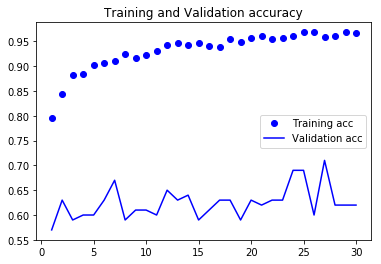

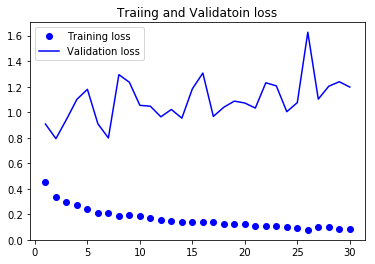

In [0]:
import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Traiing and Validatoin loss')
plt.legend()

plt.show()

###Predicting the accuracy of Test set on trained model

In [0]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print(test_acc)

0.66


###Reloading the best model

In [0]:
from keras.models import load_model

del model  # deletes the existing model

# returns a compiled model
# identical to the previous one
model = load_model(filepath)

/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:327: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


###Predicting the accuracy of Test set on best model

In [0]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print(test_acc)

0.78


###Verifying the Test set image-wise

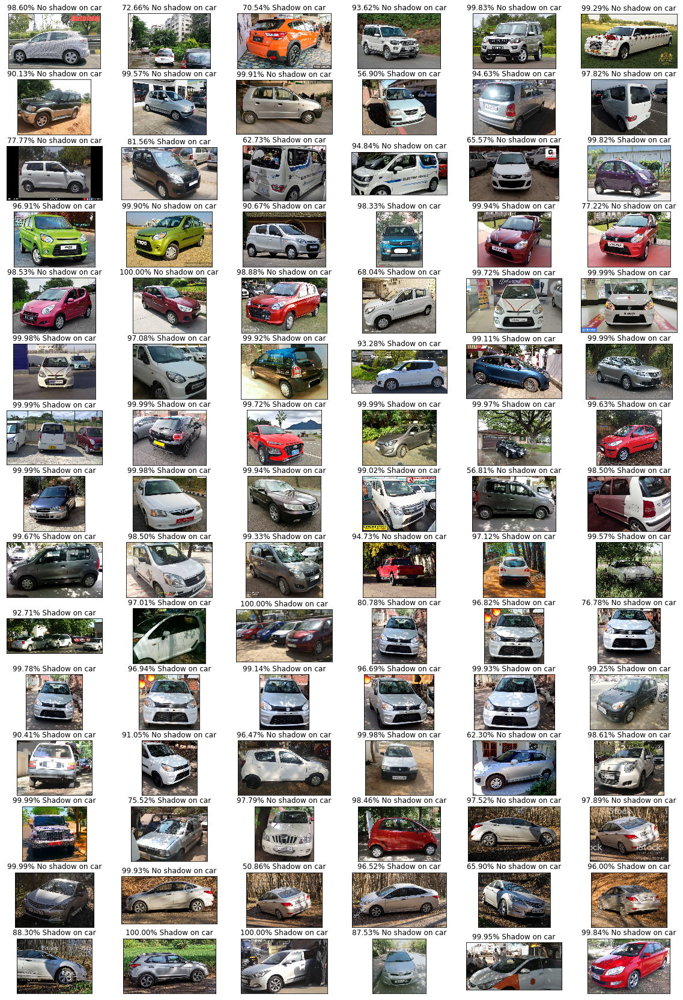

In [0]:
probabilities = model.predict_generator(test_generator, steps=len(test_generator))

import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing import image

plt.figure(figsize=(20,30))

for index, probability in enumerate(probabilities):
    image_path = os.path.join(test_dir,test_generator.filenames[index])
    img = image.load_img(image_path)
    plt.subplot(15,6,index+1)
    plt.imshow(img)
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% Shadow on car")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% No shadow on car")
    
    plt.xticks([])
    plt.yticks([]) 

#Fine-Tuning

In [0]:
conv_base.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 150, 150, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0         
__________

###Assembling the model again (this time keeping last 3 VGG16 layers trainable)

In [0]:
from keras import models, layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.summary()

conv_base.trainable = True

set_trainable=False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_2 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_3 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 2,097,665
Non-trainable params: 14,714,688
_________________________________________________________________


###Training the model with smaller learning rate and longer than before

In [0]:
model.compile(loss='binary_crossentropy',
             optimizer=optimizers.RMSprop(lr=1e-5),
             metrics=['acc'])

In [20]:
from keras.callbacks import ModelCheckpoint

filepath = os.path.join(base_dir,'best_car_model_5c_VGG16_finetune.h5')
checkpoint = ModelCheckpoint(filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

   
history = model.fit_generator(train_generator,
                              steps_per_epoch=100,
                              epochs=60,
                              validation_data=validation_generator,
                              validation_steps=50,
                              callbacks=[checkpoint])

Epoch 1/60
100/100 [==============================] - 56s 562ms/step - loss: 0.4810 - acc: 0.7750 - val_loss: 0.7837 - val_acc: 0.5900

Epoch 00001: val_acc improved from -inf to 0.59000, saving model to drive/My Drive/ClaimGenius/best_car_model_5c_VGG16_finetune.h5
Epoch 2/60
100/100 [==============================] - 51s 513ms/step - loss: 0.3178 - acc: 0.8665 - val_loss: 0.8324 - val_acc: 0.6090

Epoch 00002: val_acc improved from 0.59000 to 0.60900, saving model to drive/My Drive/ClaimGenius/best_car_model_5c_VGG16_finetune.h5
Epoch 3/60
100/100 [==============================] - 50s 501ms/step - loss: 0.2619 - acc: 0.8815 - val_loss: 0.6438 - val_acc: 0.7170

Epoch 00003: val_acc improved from 0.60900 to 0.71700, saving model to drive/My Drive/ClaimGenius/best_car_model_5c_VGG16_finetune.h5
Epoch 4/60
100/100 [==============================] - 48s 479ms/step - loss: 0.1998 - acc: 0.9240 - val_loss: 1.1696 - val_acc: 0.6110

Epoch 00004: val_acc did not improve from 0.71700
Epoch 5

###Plotting the accuracy and loss curves

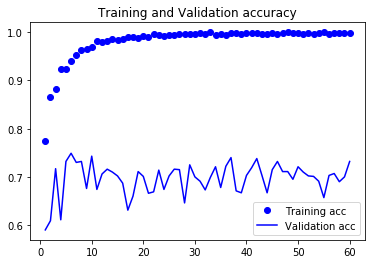

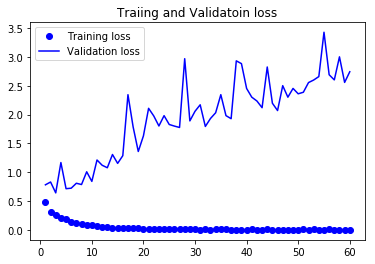

In [21]:
import matplotlib.pyplot as plt
%matplotlib inline

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and Validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Traiing and Validatoin loss')
plt.legend()

plt.show()

##Testing model just trained

In [22]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print(test_acc)

0.84


###Reloading the best model

In [0]:
from keras.models import load_model

del model  # deletes the existing model

# returns a compiled model
# identical to the previous one
model = load_model(filepath)

##Testing best model just saved

In [24]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print(test_acc)

0.68


##Testing model on Test set images

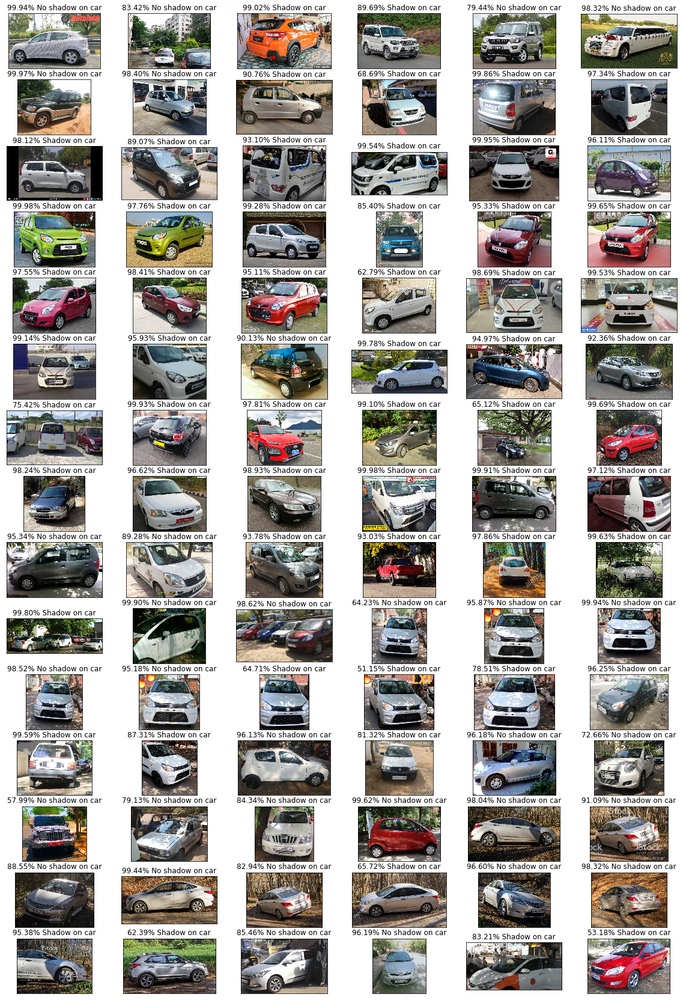

In [25]:
probabilities = model.predict_generator(test_generator, steps=len(test_generator))

import matplotlib.pyplot as plt
import numpy as np
from keras.preprocessing import image

plt.figure(figsize=(20,30))

for index, probability in enumerate(probabilities):
    image_path = os.path.join(test_dir,test_generator.filenames[index])
    img = image.load_img(image_path)
    plt.subplot(15,6,index+1)
    plt.imshow(img)
    if probability > 0.5:
        plt.title("%.2f" % (probability[0]*100) + "% Shadow on car")
    else:
        plt.title("%.2f" % ((1-probability[0])*100) + "% No shadow on car")
    
    plt.xticks([])
    plt.yticks([]) 

In [36]:
test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print(test_acc)

0.62


In [37]:
print(test_loss)

1.0907950158845052


##Testing individual Car image

###Testing car images with Shadows on it

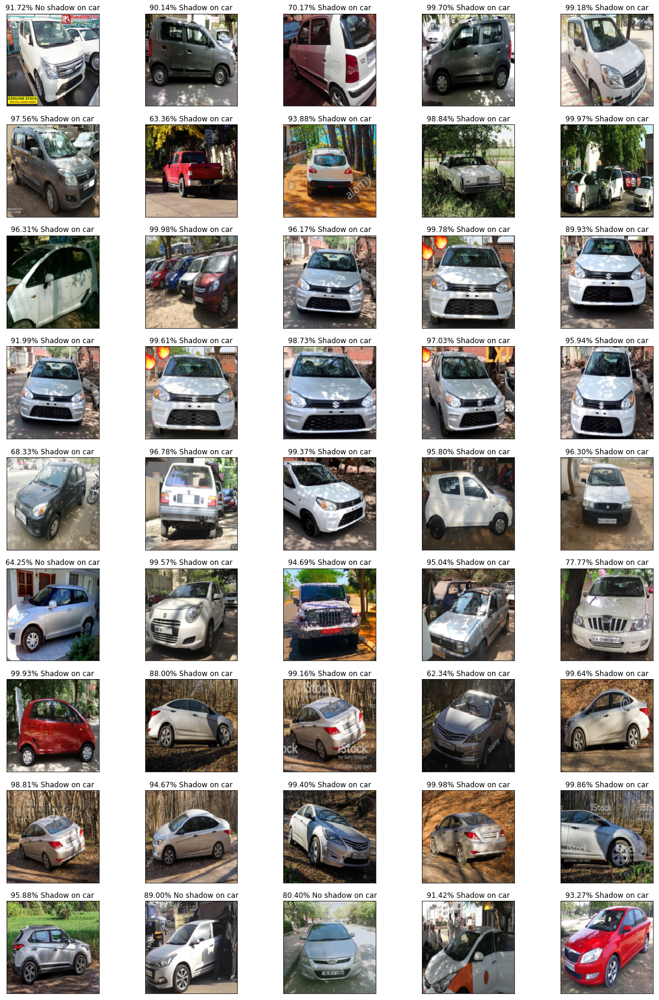

In [28]:
base_dir = 'drive/My Drive/ClaimGenius'
testFile = os.path.join(base_dir,'test','car_shadow')
modelPath = os.path.join(base_dir,'best_car_model_5c_VGG16_finetune.h5')


model = load_model(modelPath)
#fname = 'car_shadow_278.jpg' # pred = 7
plt.figure(figsize=(20,30))

fnames = ['car_shadow_{}.jpg'.format(i) for i in range(251,296)]
for index, fname in enumerate(fnames):
  src = os.path.join(testFile,fname)
  try:
    img = image.load_img(src, target_size=(150,150),interpolation='bilinear')
  except FileNotFoundError:
    src = src[:-3]+'JPG'
    img = image.load_img(src, target_size=(150,150),interpolation='bilinear')
  test_tensor = image.img_to_array(img)
  test_tensor /= 255
  test_tensor = test_tensor[np.newaxis]
  pred = model.predict(test_tensor)
  plt.subplot(9,5,index+1)
  plt.imshow(img)
  if pred > 0.5:
    plt.title("%.2f" % (pred[0]*100) + "% Shadow on car")
  else:
    plt.title("%.2f" % ((1-pred[0])*100) + "% No shadow on car")
  plt.xticks([])
  plt.yticks([])


###Testing Car images with no shadow on it

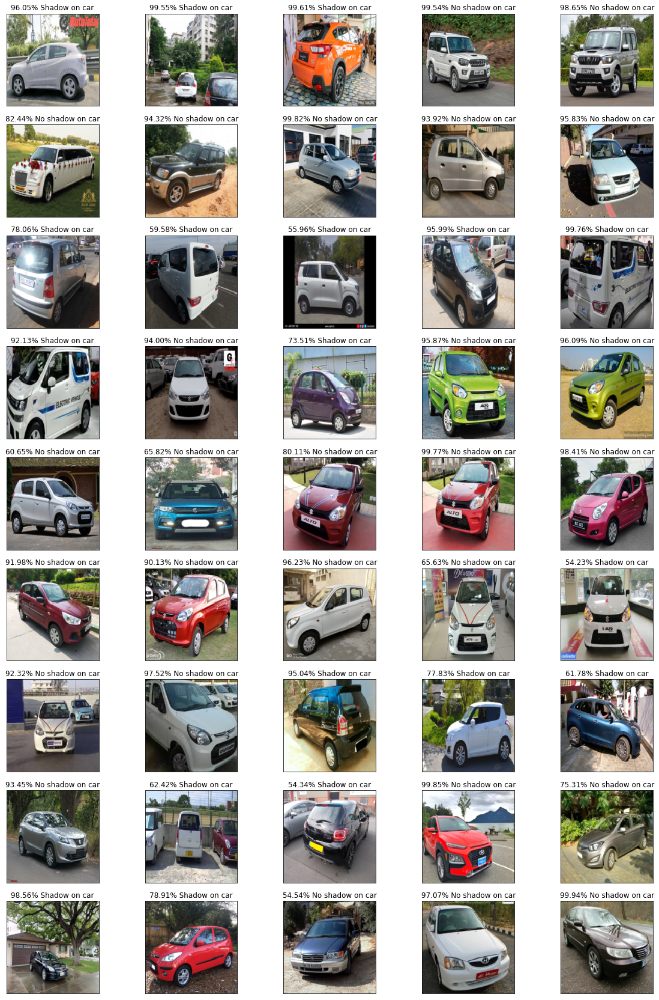

In [29]:
testFile = os.path.join(base_dir,'test','car_noshadow')
modelPath = os.path.join(base_dir,'best_car_model_5c_VGG16_finetune.h5')


model = load_model(modelPath)
plt.figure(figsize=(20,30))

fnames = ['car_noshadow_{}.jpg'.format(i) for i in range(251,296)]
for index, fname in enumerate(fnames):
  src = os.path.join(testFile,fname)
  try:
    img = image.load_img(src, target_size=(150,150),interpolation='bilinear')
  except FileNotFoundError:
    src = src[:-3]+'JPG'
    img = image.load_img(src, target_size=(150,150),interpolation='bilinear')
  test_tensor = image.img_to_array(img)
  test_tensor /= 255
  test_tensor = test_tensor[np.newaxis]
  pred = model.predict(test_tensor)
  plt.subplot(9,5,index+1)
  plt.imshow(img)
  if pred > 0.5:
    plt.title("%.2f" % (pred[0]*100) + "% Shadow on car")
  else:
    plt.title("%.2f" % ((1-pred[0])*100) + "% No shadow on car")
  plt.xticks([])
  plt.yticks([])